# Project 4. Advanced lane finding


### 1. Import all the packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import glob
from moviepy.editor import VideoFileClip
from collections import deque

%matplotlib inline

### 2. Undistort the images
The first step is to remove the distortion introduced by lense aberations in the image. For this we use a checker board pattern and few images of the checker board taken from the particular camera. Remember that for every camera we have to do this process. We then find the camera caliberation matrix and the distortion ofefficients from these images.

In [2]:
# util methords for comparing input and outputs

def show_comparison(image, function, gray=False):
    '''
    Method take an image and a modification function
    show the image before and after the modification
    '''
    image = cv2.imread(image)
    _, image, modified_image = function(image)
#     print(image)
    figure, axes = plt.subplots(1, 2, figsize=(15,4))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image', fontsize=12)
#     axes[0].y_ticks=None

    if gray is True:
        axes[1].imshow(modified_image, cmap='gray')
    else:
        axes[1].imshow(cv2.cvtColor(modified_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Modified Image', fontsize=12)
    # turn off tricks
    

def compare_images(original_img, modified_img):
    '''
    Method take an image and a modification function
    show the image before and after the modification
    '''
    
    figure, axes = plt.subplots(1, 2, figsize=(15,4))
    axes[0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image', fontsize=12)
    axes[1].imshow(cv2.cvtColor(modified_img, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Modified Image', fontsize=12)

In [3]:
inner_corners_count_x = 9
inner_corners_count_y = 6

calibration_images = glob.glob('camera_cal/calibration*.jpg')
road_images = glob.glob('test_images/*.jpg')

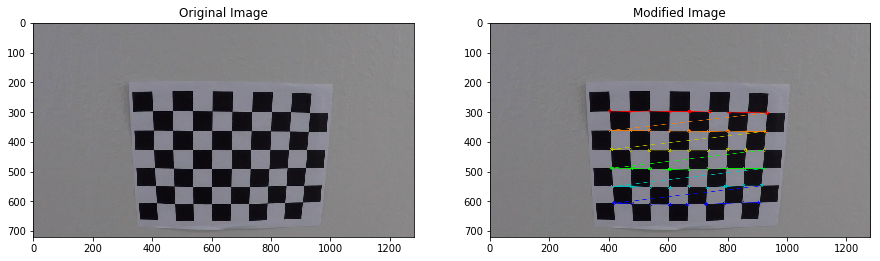

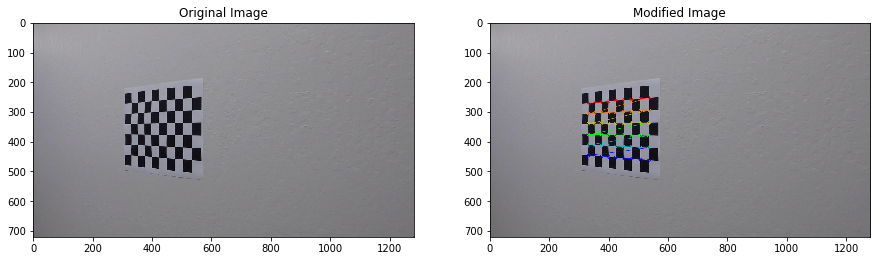

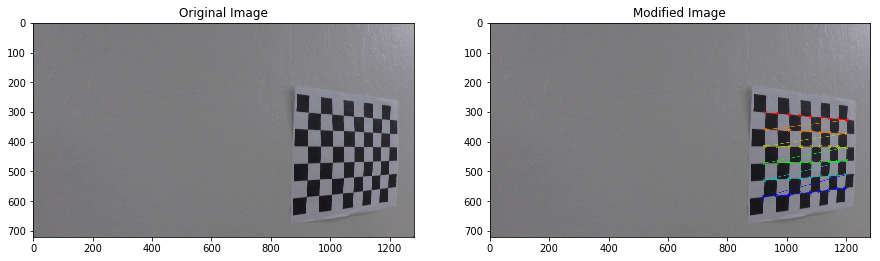

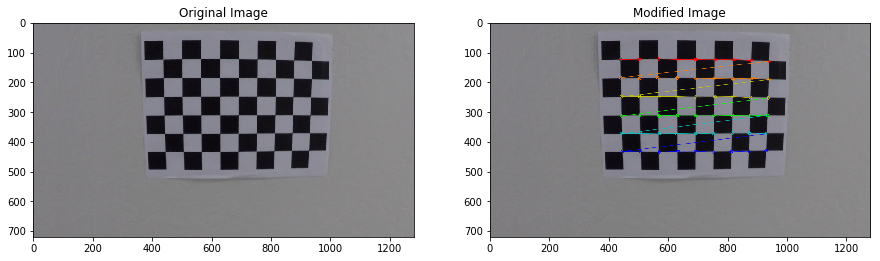

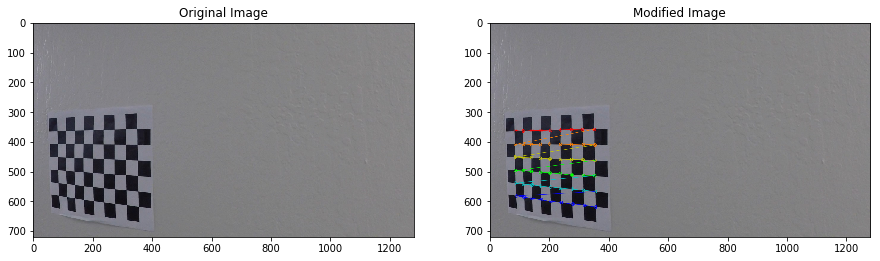

...

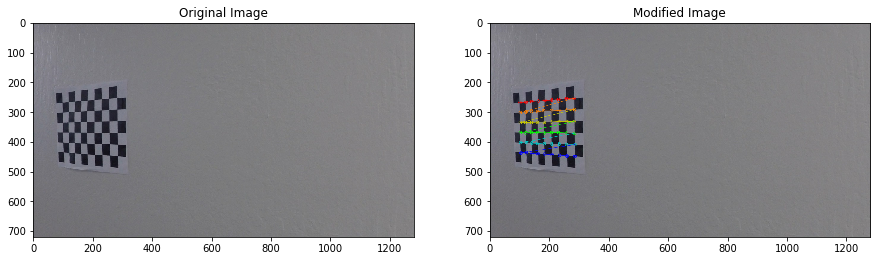

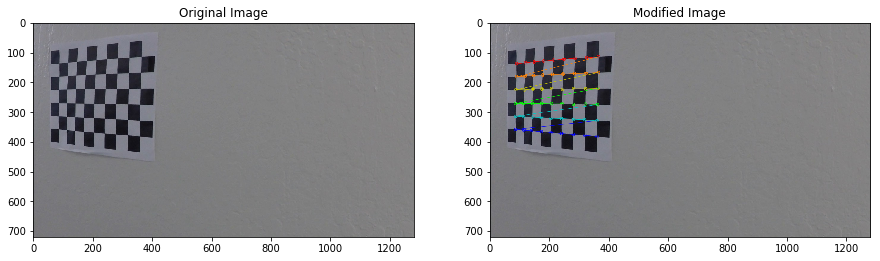

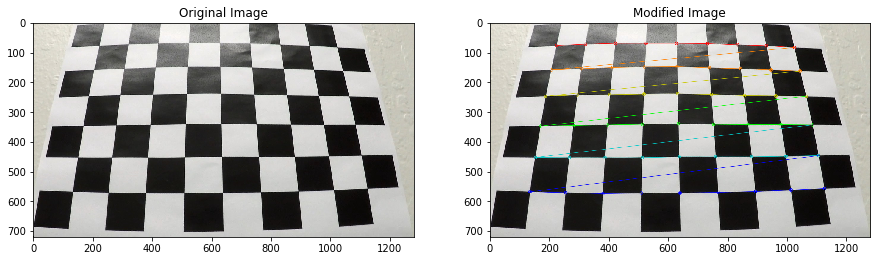

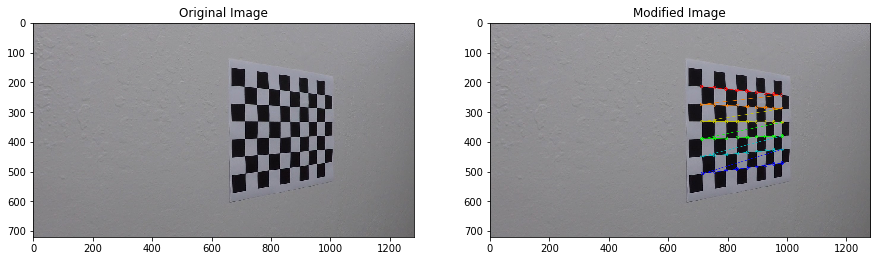

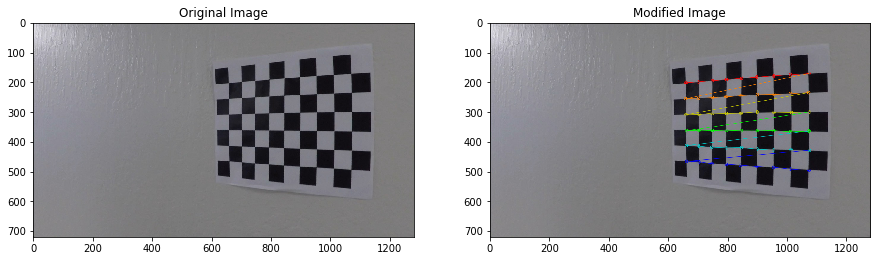

In [4]:

# Define the 3d points 
object_points = np.zeros(((inner_corners_count_x*inner_corners_count_y), 3), np.float32)
object_points[:,:2] = np.mgrid[0:inner_corners_count_x, 0:inner_corners_count_y].T.reshape(-1,2)

# print(object_points)

points_3d =[]
points_2d =[]

for i, image in enumerate(calibration_images):
    img = cv2.imread(image)
    img_dup = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Opencv function to find corners
    ret, corners = cv2.findChessboardCorners(gray, (inner_corners_count_x,inner_corners_count_y), None)
    
    # Finding corners if ret is true
    if ret == True:
        points_3d.append(object_points)
        points_2d.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (inner_corners_count_x, inner_corners_count_y), corners, ret)
        
        compare_images(img_dup, img)

In [5]:
def undistort(img, show_grid=False):
    '''
    The function takes in an image and outputs undistorted image
    '''
    img_size = (img.shape[1], img.shape[0])
    
    if show_grid:
        #width /10
        img_x = int(img_size[0]/10)

        #height /10
        img_y = int(img_size[1]/10)

        # For visualizing the grid
        for i in range(10):
            cv2.line(img, (i* img_x, 0), (i* img_x, img_size[0]), (0, 0, 255), 3)
            cv2.line(img, (0, i* img_y), (img_size[0], i* img_y), (0, 0, 255), 3)
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(points_3d, points_2d, img_size, None, None)
    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    
#     save_path = './undistort/'+ image
#     print(save_path)
#     cv2.imwrite(save_path, undistort)

    return img, undistort

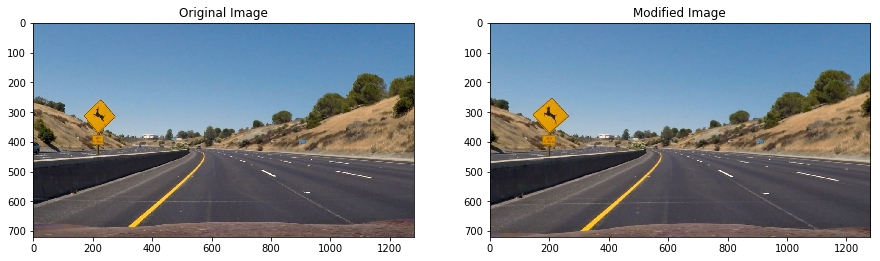

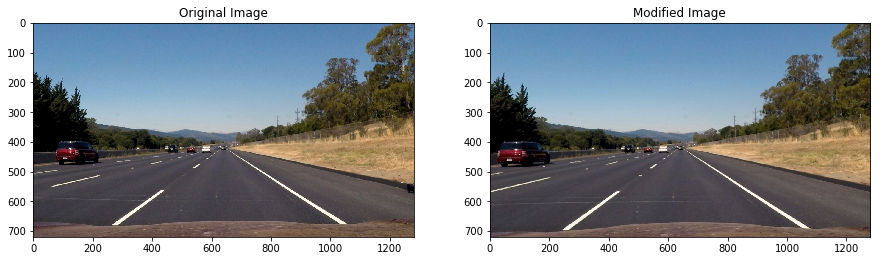

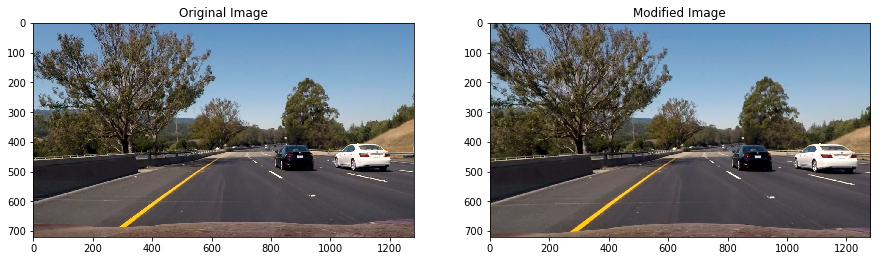

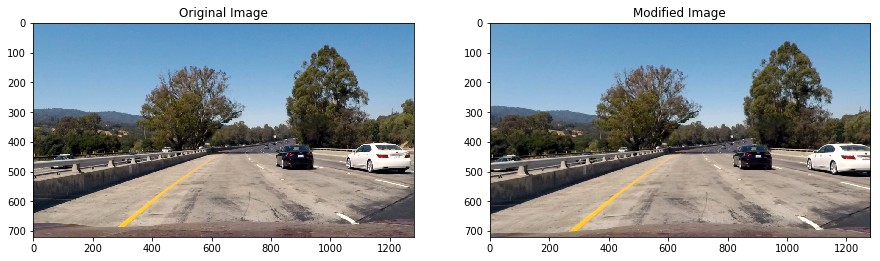

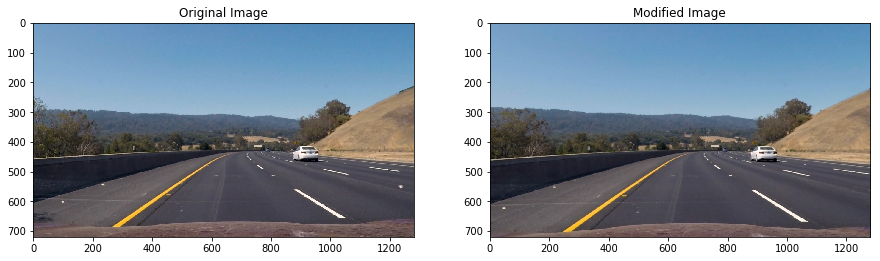

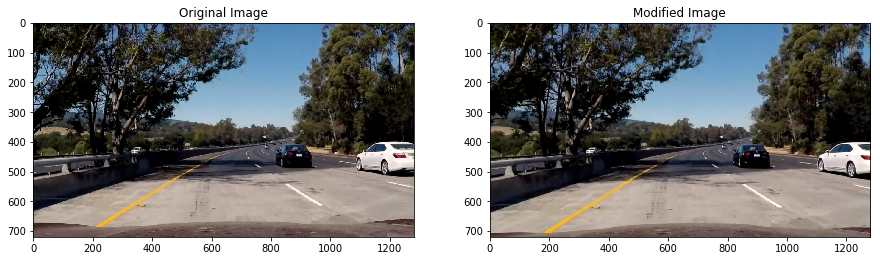

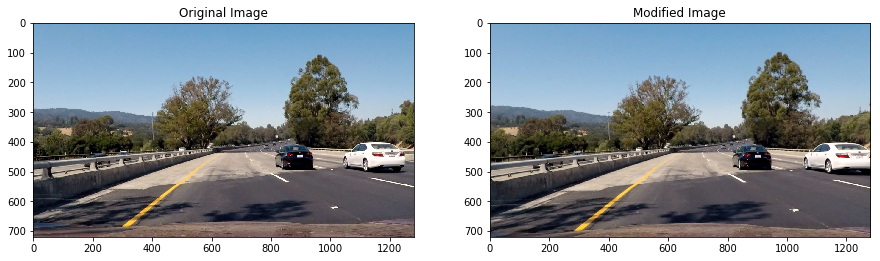

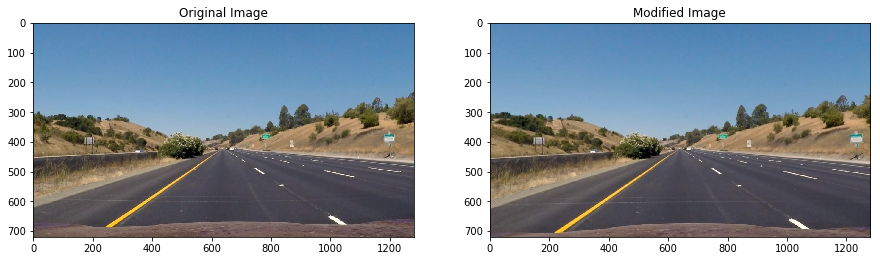

In [6]:
for image in road_images:
    image = cv2.imread(image)
    img, undistorted_image = undistort(image)
    compare_images(img, undistorted_image)

### 3. Take birds eye view of the lane lines
Next step is to transform the image image such that the lane lines become parellal. This transform is called birds eye transform. Transforming the image to birds eye view will later help easily fit polynomial on the lane lines

In [7]:
def find_perspective_matrix():
    """
    Returns the Perspective matrix
    """
    src = np.float32([[576, 462],[708, 462],
                      [1068, 688],[238, 688]])
    
    dst = np.float32([[200, 200], [1080, 200], 
                     [1080, 720],[200, 720]])

    perspective_matrix = cv2.getPerspectiveTransform(src, dst)
    return perspective_matrix

perspective_matrix = find_perspective_matrix()

def birds_eye_transform(image, show_border=True):
    """
    Performs distortion correction followed by
    birds eye transformation on the given image
    """
    original_img, img = undistort(image, show_grid=False)
    
    if show_border:
        # For testing draw lines on the source image and see how they get transformed
        cv2.line(img, (576, 462), (708, 462), (0, 0, 255), 2)
        cv2.line(img, (708, 462), (1068, 688), (0, 0, 255), 2)
        cv2.line(img, (1068, 688), (238, 688), (0, 0, 255), 2)
        cv2.line(img, (238, 688), (576, 462), (0, 0, 255), 2)
        
    img_size = (img.shape[1], img.shape[0])
    
    warped = cv2.warpPerspective(img, perspective_matrix, img_size)
    
    return original_img, img, warped

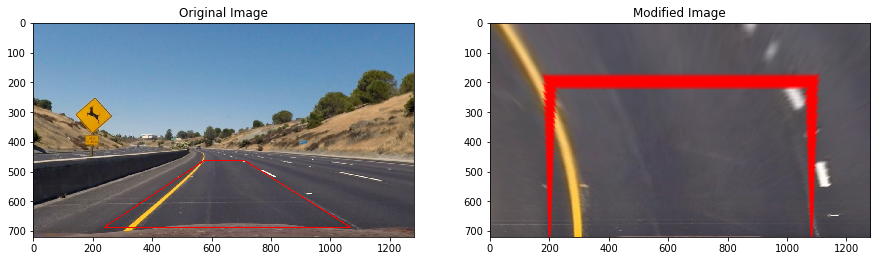

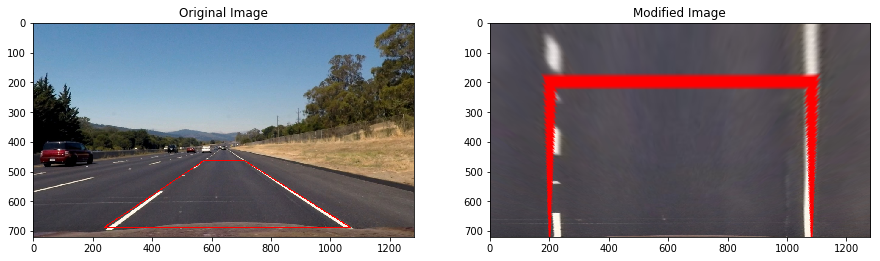

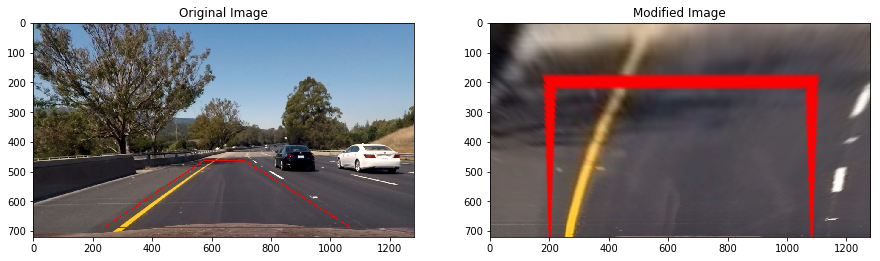

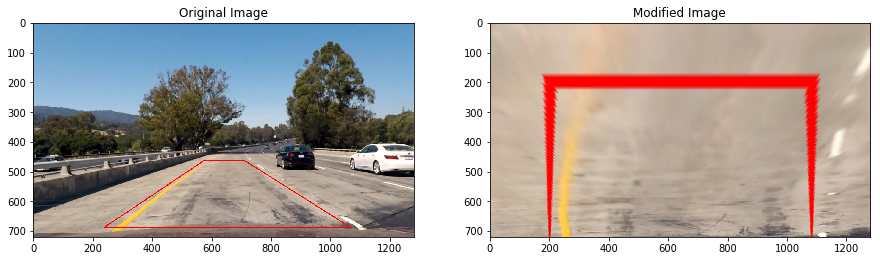

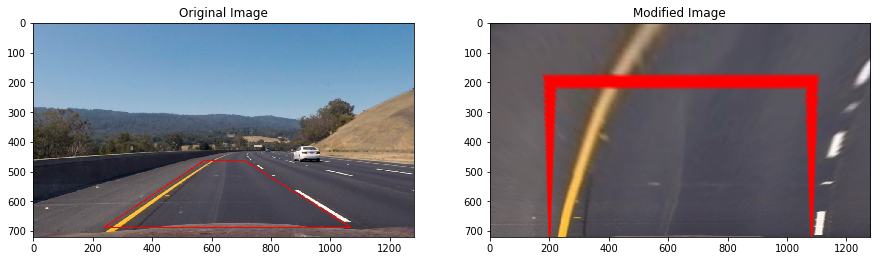

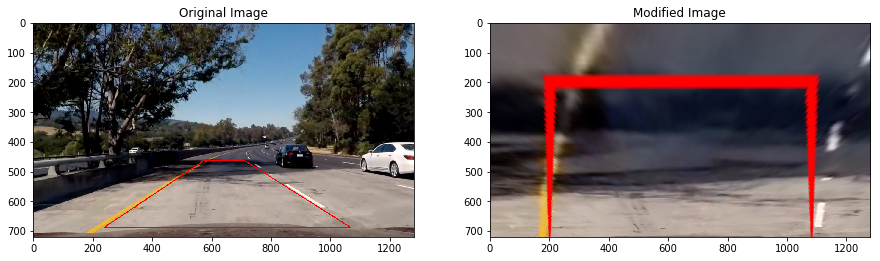

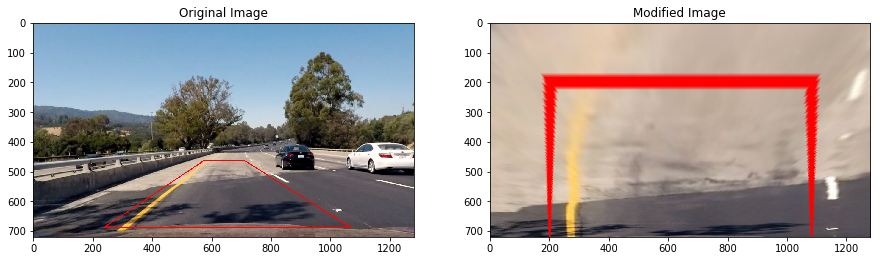

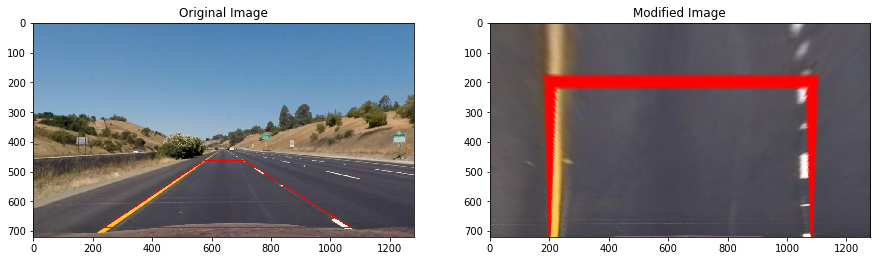

In [8]:
for image in road_images:
    show_comparison(image, birds_eye_transform)

### 4. Applying binary thresholds
In the bird eye view of the image we need to apply binary thresholding to isolate and identify the lane lines alone. This can be done by binary thresholding in different color spaces.

In [9]:
def binary_threshold(image):
    """
    Performs distortion correction, bird eye transforma and binary thresholding
    """
    _, undistorted_img, img = birds_eye_transform(image, show_border=False)
    
    l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]

    b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    combined_binary = np.zeros_like(l_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    
    return undistorted_image, img, combined_binary

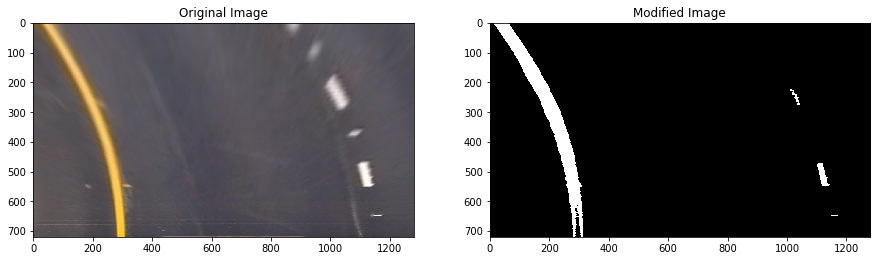

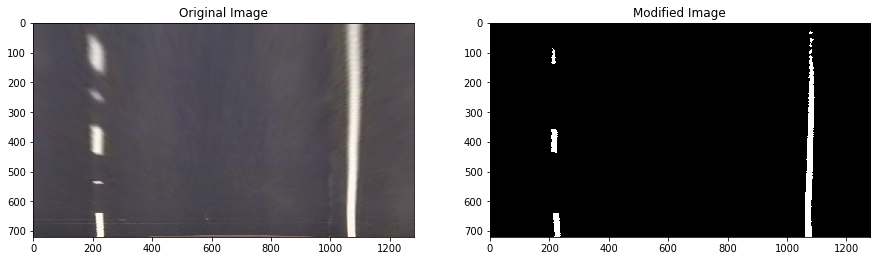

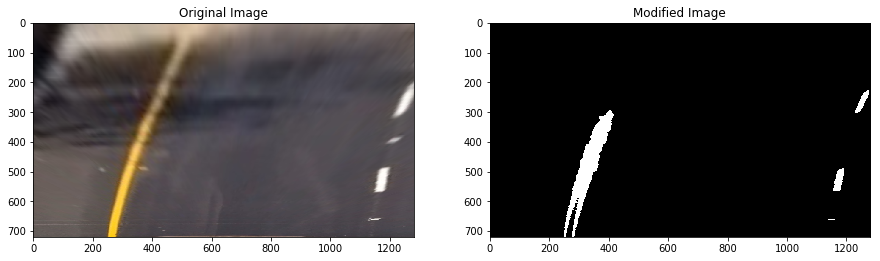

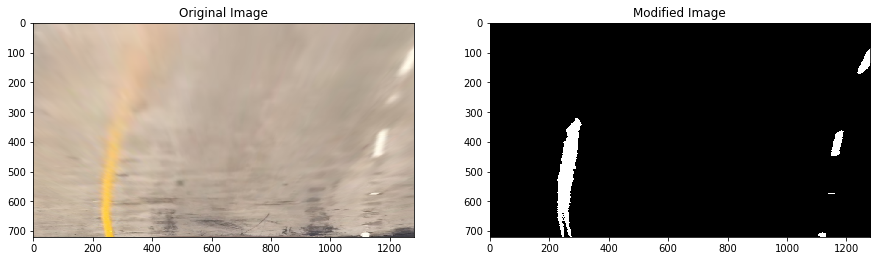

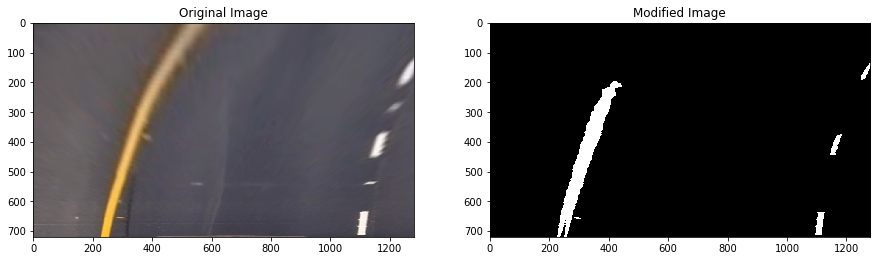

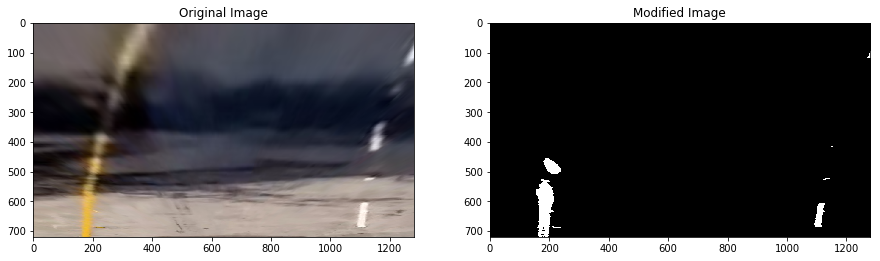

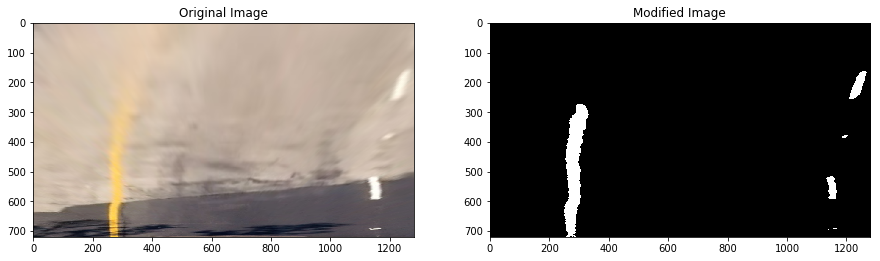

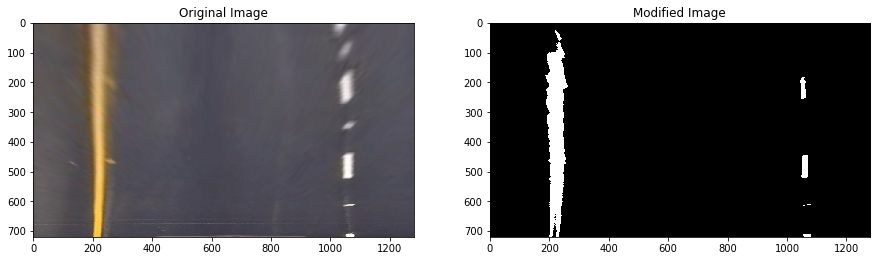

In [10]:
for image in road_images:
    show_comparison(image, binary_threshold, True)

In [11]:
def mark_lane(image):
    """
    
    apply distortion correction, birds eye, binary thersholding and polynomial fitting
    
    """
    undistorted_img, bird_img, test_img_bin = binary_threshold(image)
    bird_img_org = bird_img.copy()
    poses_left_x = []
    poses_left_y = []
    poses_right_x = []
    poses_right_y = []

    for i in range(test_img_bin.shape[0]):
        array_left = test_img_bin[i, :640]
        array_right = test_img_bin[i, 640:]
        pos_left = np.argmax(array_left)
        pos_right = np.argmax(array_right)
        if pos_left > 0:
            count_left = len(np.where(test_img_bin[1, :] == 1)[0])
            count_left = int(count_left/2)
            pos_left = pos_left + count_left
            poses_left_x.append(pos_left)
            poses_left_y.append(i)
#             cv2.circle(bird_img, (pos_left, i), 3, (255,255,255))
        if pos_right > 0:
            count_right = len(np.where(test_img_bin[1, :] == 1)[0])
            count_right = int(count_right/2)
            pos_right = pos_right + count_right
            poses_right_x.append(640 +pos_right)
            poses_right_y.append(i)
#             cv2.circle(bird_img, (640 + pos_right, i), 3, (255,255,255))

#     print('poses left x: ' , poses_left_x)
#     print('poses left y: ' , poses_left_y)
#     print('poses right x: ' , poses_right_x)
#     print('poses right y: ' , poses_right_y)

#     left_points_count = len(poses_left_x)
#     left_points_mid = int(left_points_count/2)
    
#     right_points_count = len(poses_right_x)
#     right_points_mid = int(right_points_count/2)
    
#     left_ys = [poses_left_y[0], poses_left_y[left_points_mid], poses_left_y[-1]]
#     left_xs = [poses_left_x[0], poses_left_x[left_points_mid], poses_left_x[-1]]
    
#     right_ys = [poses_right_y[0], poses_right_y[right_points_mid], poses_right_y[-1]]
#     right_xs = [poses_right_x[0], poses_right_x[right_points_mid], poses_right_x[-1]]

    left_poly = np.polyfit(poses_left_y, poses_left_x, 2)
    right_poly = np.polyfit(poses_right_y, poses_right_x, 2)

#     left_poly = np.polyfit(left_ys, left_xs, 2)
#     right_poly = np.polyfit(right_ys, right_xs, 2)

#     print(left_fit)
    return undistorted_img, bird_img_org, bird_img, left_poly, right_poly


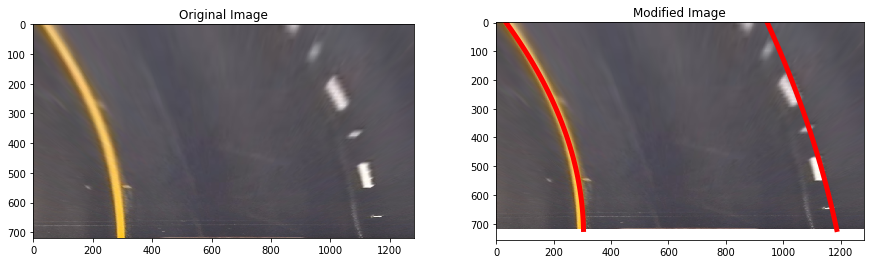

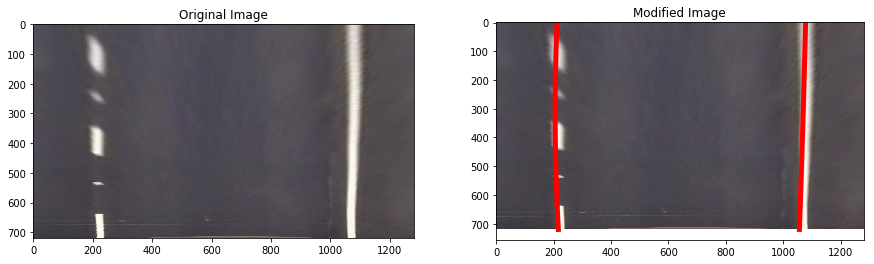

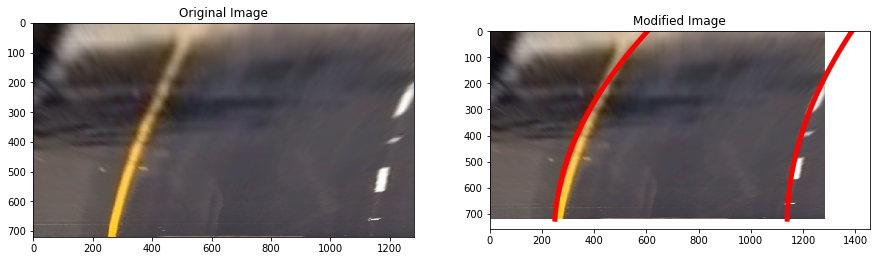

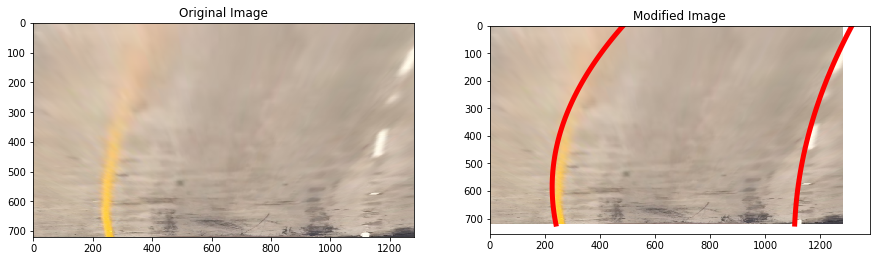

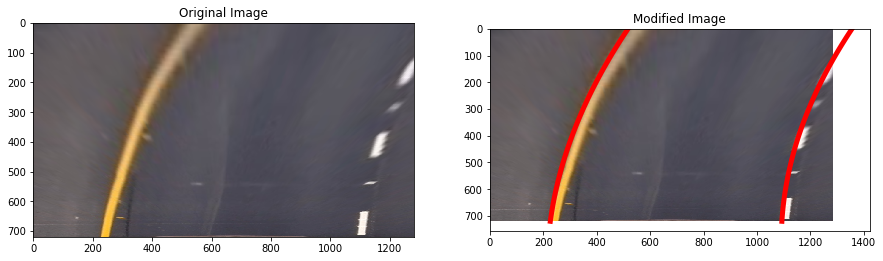

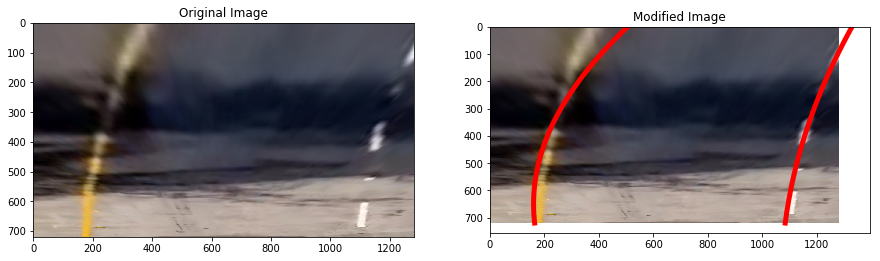

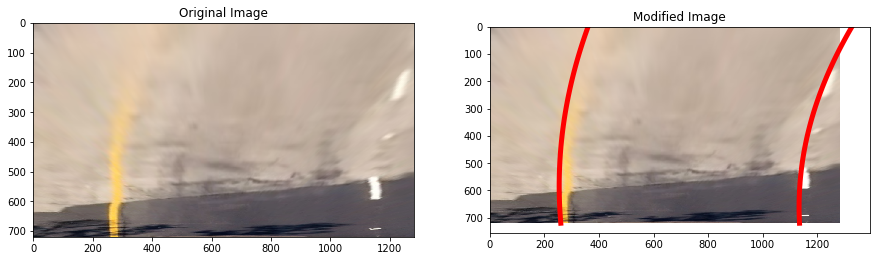

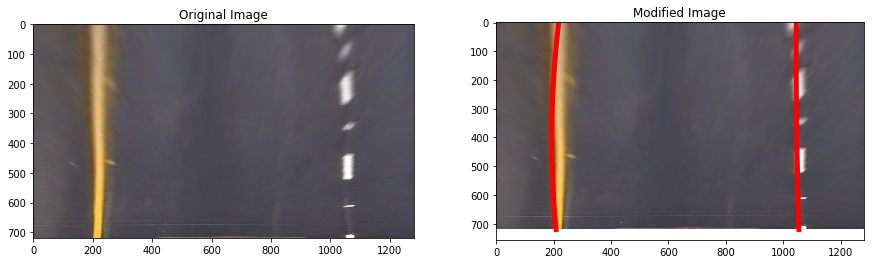

In [12]:
for image in road_images:
    image = cv2.imread(image)
    _, org, trs, left_poly, right_poly = mark_lane(image)
    compare_images(org, trs)
    
    xp = np.linspace(0, 720, 100)
    
    p_left = np.poly1d(left_poly)
    p_right = np.poly1d(right_poly)
    xpy_left = p_left(xp)
    xpy_right = p_right(xp)
    
    plt.plot(xpy_left, xp, color='red', linewidth=5)
    plt.plot(xpy_right, xp, color='red', linewidth=5)
    plt.show()

In [13]:
Minv = np.linalg.inv(perspective_matrix)

def mark_lane_pipeline(image):
    """
    
    The Pipeline function which takes in an image and returns the lane marked and labeled output
    
    """
    undistorted_image, org, trs, left_poly, right_poly = mark_lane(image)
    
    xp = np.linspace(0, 720, 100)
    
    p_left = np.poly1d(left_poly)
    p_right = np.poly1d(right_poly)
    
    xpy_left = p_left(xp)
    xpy_right = p_right(xp)
    
    
    # Calculating the distance from middle
    pos_point_left= xpy_left[-1]
    pos_point_right=xpy_right[-1]
    
    car_middle = (pos_point_left + pos_point_right )/2
    actual_middle = image.shape[1]/2
    
    difference_from_middle = actual_middle - car_middle
    distance_in_meter = (3.7/700)*difference_from_middle
    distance_in_meter = float(format(distance_in_meter,'.2f'))
    
    # Calculating radius of curvature
    y_eval = np.max(xp)
#     left_curverad = ((1 + (2*left_poly[0]*y_eval + left_poly[1])**2)**1.5) / np.absolute(2*left_poly[0])
#     right_curverad = ((1 + (2*right_poly[0]*y_eval + right_poly[1])**2)**1.5) / np.absolute(2*right_poly[0])
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(xp*ym_per_pix, xpy_left*xm_per_pix, 2)
    right_fit_cr = np.polyfit(xp*ym_per_pix, xpy_right*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
    
    curvature = (left_curverad + right_curverad)/2

    color_warp = np.zeros_like(trs).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([xpy_left, xp]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([xpy_right, xp])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.5, 0)
    
    font                   = cv2.FONT_HERSHEY_SIMPLEX
    topRightCornerOfText = (800,100)
    fontScale              = 1
    fontColor              = (0,0,255)
    lineType               = 3
    
    distance_text = ""
    
    if distance_in_meter ==0:
        distance_text = 'At center'
    elif distance_in_meter > 0:
        distance_text = 'Off Right by : ' + str(abs(distance_in_meter)) + ' m'
    else:
        distance_text = 'Off Left by : ' + str(abs(distance_in_meter)) + ' m'

    curvature_text ='Curvature : ' + format(curvature, '0.2f') +' m'
    
    cv2.putText(result, distance_text, 
        topRightCornerOfText, 
        font, 
        fontScale,
        fontColor,
        lineType)
    
    cv2.putText(result, curvature_text, 
        (800,140), 
        font, 
        fontScale,
        fontColor,
        lineType)
    
    return result

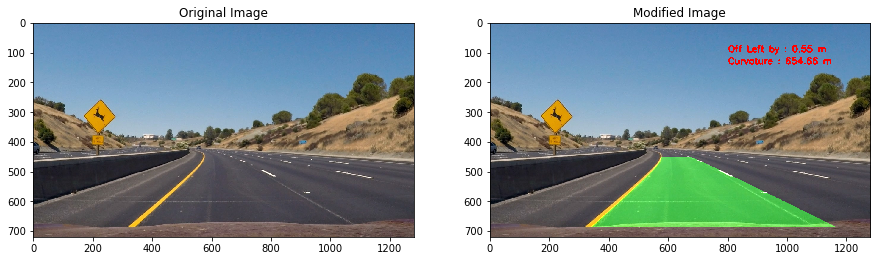

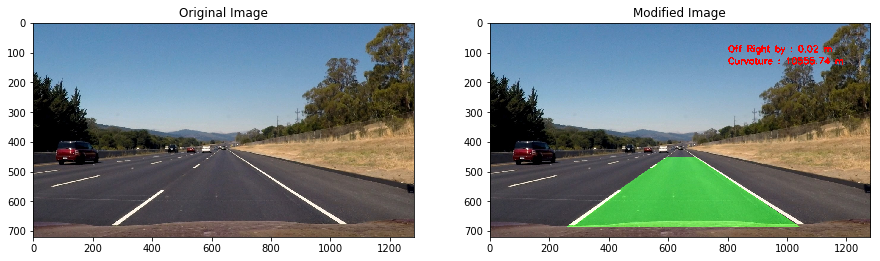

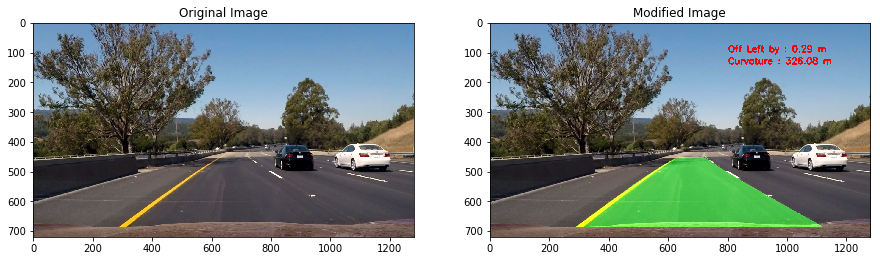

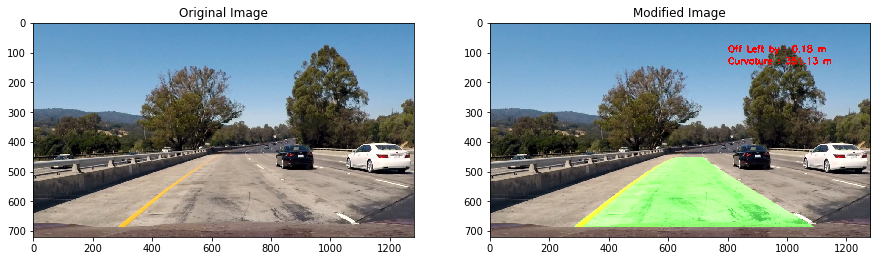

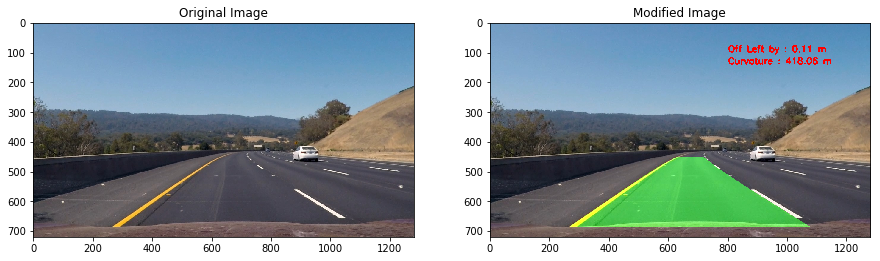

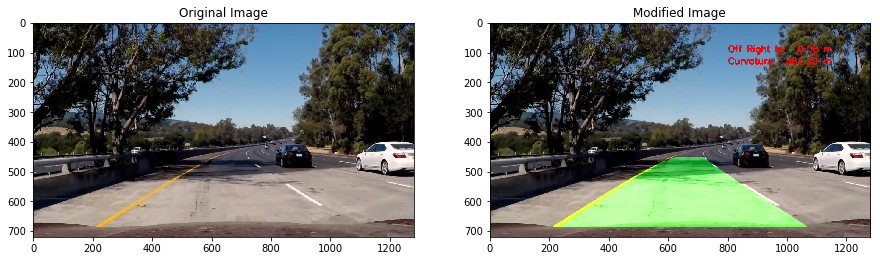

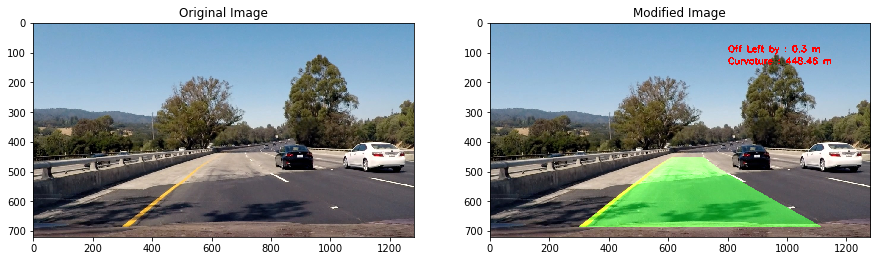

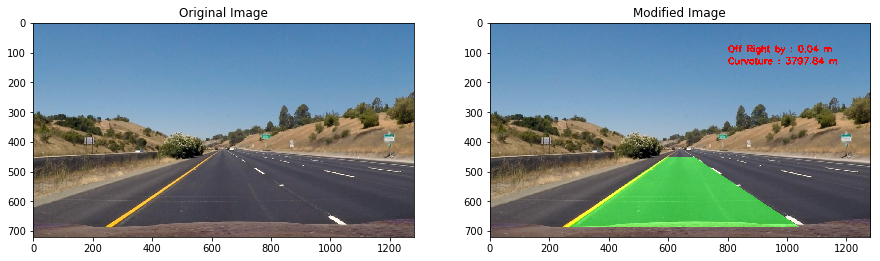

In [14]:
for image in road_images:  
    image = cv2.imread(image)
    result = mark_lane_pipeline(image)
    compare_images(image, result)

In [ ]:
def process_vid(image):
    print(image.shape)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    cv2.imwrite('test.jpg', image)
    result = mark_lane_pipeline(image)
    result = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
    return result

In [ ]:
video_output = 'result.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_vid) 
white_clip.write_videofile(video_output, audio=False)